**Working:**
This project will work in two phases in first phase we will train a model on eyes if open/closed 
using different models. After achieving good accuracy and low loss we will give it to another code 
which is phase two in which we will use face detector libraries to detect a face so we can see where 
the eyes are and then employ our model to predict if our outputs are good or not.
For first phase training I tried different model architectures, but they were too big as I wanted my 
project to run on a micro-controller. I designed a model of my own to reduce the model file size 
but when I tried to further decrease it, I got many issues like validation loss was enormous. So, the 
model I used is the max size reduced and efficient model which I tried to develop.
There are many face-detection libraries, but I went with this was because it was more accurate and 
gave better results as compared to other libraries such as harsh cascade even thought it might be 
more computationally complex or consuming.




1.   First we will intiate our Dataset Loctaion i.e Testing and Training.
2.   Then we will use image genrator to preprocess our Training images.
3.   Define our hyper-parameters such as batch size , epochs ,etc.
4.   Design your model or just used the pre-defined ones like inception or vgg, etc.
5.   After that fit our model mean train.
6.   Last but no least save our model in 'h' file format
7.   Load the saved model and validate the model for its accuracy and loss.
8.   Plot the loss and accuracy of our model
 



In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sun Dec  4 20:53:03 2022

@author: sanau
"""
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.optimizers import RMSprop
from keras.layers import Activation, Dropout, Flatten, Dense, GlobalMaxPooling2D, Conv2D, MaxPooling2D
from keras.callbacks import CSVLogger
from sklearn.model_selection import train_test_split


# Taking Path Files for Training and Testing 
path = '/content/Untitled/data'
train_dir = os.path.join(path, 'train')
test_dir = os.path.join(path, 'test')
print(train_dir)
print(test_dir)
print(os.listdir(train_dir))

# Hyperparams
IMAGE_SIZE = 128
IMAGE_WIDTH, IMAGE_HEIGHT = IMAGE_SIZE, IMAGE_SIZE
EPOCHS = 10
BATCH_SIZE = 16

input_shape = (IMAGE_WIDTH, IMAGE_HEIGHT, 3)

# data generators
training_data_generator = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

validation_data_generator = ImageDataGenerator(rescale=1./255)
# Data preparation

training_generator = training_data_generator.flow_from_directory(
    train_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")
validation_generator = validation_data_generator.flow_from_directory(
    test_dir,
    target_size=(IMAGE_WIDTH, IMAGE_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode="binary")


sample, label = next(validation_generator)
print(sample[0])
print(label[0])

# model
# model
model = Sequential()

model.add(Conv2D(16, 3, input_shape=input_shape, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(16, 3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())

model.add(Dropout(0.7))
model.add(Dense(16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation = 'sigmoid'))

# model.add(Activation('sigmoid'))
model.summary()
# compile model

model.compile(loss='binary_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

print(len(training_generator.filenames))
# train model

history=model.fit(
    training_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
)


model.save('/content/drive/MyDrive/models/Drowsiness_model.h5')
 #   validation_steps=len(validation_generator.filenames) // BATCH_SIZE

model = tf.keras.models.load_model('/content/drive/MyDrive/models/Drowsiness_model.h5')


sample1, label1 = next(validation_generator)
predictions = model.predict(sample1)
print(predictions)


def check_results():
   class_names = [ 'Open_Eyes', 'Closed_Eyes']
   sample1, label1 = next(validation_generator)
   predictions = model.predict(sample1)
   for num in range(len(predictions)):
       if predictions[num] > 0.5:    
           print('prediction: '+'Closed_Eyes'+' ' + str(int(predictions[num]*100))+ '%')
       else:    
           print('prediction: '+'Open_Eyes'+' ' + str(100- int(predictions[num]*100))+ '%')
          
       print('actual: '+ class_names[int(label1[num])])
       plt.imshow(sample1[num])
       plt.show()

#check_results()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show() 
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


/content/Untitled/data/train
/content/Untitled/data/test


FileNotFoundError: ignored

**Install the face recoginiton and playing sound libraries to detect face for predciting if the eyes are closed or open.**

In [ ]:
!pip install playsound
#!pip install -U PyObjC
!pip install face_recognition
!pip install -U tensorboard_plugin_profile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7038 sha256=1a13bb33ba018217aec3f5de54307f580bdb6c998eb8ee937e46cc7b3fb9a338
  Stored in directory: /root/.cache/pip/wheels/73/cd/cf/9750b618d54bd81c20e4c34fb24a423a5b095920367cdb3f71
Successfully built playsound
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 100.1 MB 27 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566185 sha256=df6881231edb8792748a3f9989729df4941352f4df21ee07164218153e6a3cfd
  Stored in directory: /root/.cache/pip/wheels/b4/4b/8f/751e99d45f089bdf366a7d3e5066db3c2b84a62e4377f534d7
Successfully built face-recognition-models
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |██████



1.   We will run face recognition library to detect the face
2. Then use some conditions to detect the eyes on the face to see if the eyes are open or closed.
3. After predicting we will make some boxes to tell if the camera is active or not and if the driver is sleeping or not.
4. If the driver is sleeping for 3 or more frames a box will appearing saying driver is sleeping.
5. You can also play a sound to wake him up.



In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sat Dec 10 19:12:01 2022

@author: sanau
"""
from datetime import datetime
from packaging import version
import os
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from playsound import playsound
from PIL import Image, ImageDraw
import face_recognition
from tensorflow import keras
#from pygame import mixer

# Create a TensorBoard callback
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")

#eye_model = keras.models.load_model('/content/drive/MyDrive/models/Drowsiness_model.h5')
eye_model = keras.models.load_model('/content/drive/MyDrive/models/Drowsiness_model.h5')

# webcam frame is inputted into function
def eye_cropper(frame):

    # create a variable for the facial feature coordinates
    facial_features_list = face_recognition.face_landmarks(frame)

    # create a placeholder list for the eye coordinates
    # and append coordinates for eyes to list unless eyes
    # weren't found by facial recognition
    try:
        eye = facial_features_list[0]['left_eye']
    except:
        try:
            eye = facial_features_list[0]['right_eye']
        except:
            return
    
    # establish the max x and y coordinates of the eye
    x_max = max([coordinate[0] for coordinate in eye])
    x_min = min([coordinate[0] for coordinate in eye])
    y_max = max([coordinate[1] for coordinate in eye])
    y_min = min([coordinate[1] for coordinate in eye])

    # establish the range of x and y coordinates
    x_range = x_max - x_min
    y_range = y_max - y_min

    # in order to make sure the full eye is captured,
    # calculate the coordinates of a square that has a
    # 50% cushion added to the axis with a larger range and
    # then match the smaller range to the cushioned larger range
    if x_range > y_range:
        right = round(.5*x_range) + x_max
        left = x_min - round(.5*x_range)
        bottom = round((((right-left) - y_range))/2) + y_max
        top = y_min - round((((right-left) - y_range))/2)
    else:
        bottom = round(.5*y_range) + y_max
        top = y_min - round(.5*y_range)
        right = round((((bottom-top) - x_range))/2) + x_max
        left = x_min - round((((bottom-top) - x_range))/2)

    # crop the image according to the coordinates determined above
    cropped = frame[top:(bottom + 1), left:(right + 1)]

    # resize the image
    cropped = cv2.resize(cropped, (128,128))
    image_for_prediction = cropped.reshape(-1, 128, 128, 3)

    return image_for_prediction

# initiate webcam
cap = cv2.VideoCapture(0)
w = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
h = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
if not cap.isOpened():
    raise IOError('Cannot open webcam')

# set a counter
counter = 0

# create a while loop that runs while webcam is in use
while True:

    # capture frames being outputted by webcam
    ret, frame = cap.read()

    # use only every other frame to manage speed and memory usage
    frame_count = 0
    if frame_count == 0:
        frame_count += 1
        pass
    else:
        count = 0
        continue

    # function called on the frame
    image_for_prediction = eye_cropper(frame)
    try:
        image_for_prediction = image_for_prediction/255.0
    except:
        continue

    # get prediction from model
    prediction = eye_model.predict(image_for_prediction)

    # Based on prediction, display either "Open Eyes" or "Closed Eyes"
    if prediction > 0.5:
        counter = 0
        status = 'Open'

        cv2.rectangle(frame, (round(w/2) - 110,20), (round(w/2) + 110, 80), (38,38,38), -1)

        cv2.putText(frame, status, (round(w/2)-80,70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,255,0), 2, cv2.LINE_4)
        x1, y1,w1,h1 = 0,0,175,75
        ## Draw black backgroun rectangle
        cv2.rectangle(frame, (x1,x1), (x1+w1-20, y1+h1-20), (0,0,0), -1)
        ## Add text
        cv2.putText(frame, 'Active', (x1 +int(w1/10), y1+int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255,0),2)
    else:
        counter = counter + 1
        status = 'Closed'

        cv2.rectangle(frame, (round(w/2) - 110,20), (round(w/2) + 110, 80), (38,38,38), -1)

        cv2.putText(frame, status, (round(w/2)-104,70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255), 2, cv2.LINE_4)
        x1, y1,w1,h1 = 0,0,175,75
        ## Draw black backgroun rectangle
        cv2.rectangle(frame, (x1,x1), (x1+w1-20, y1+h1-20), (0,0,0), -1)
        ## Add text
        cv2.putText(frame, 'Active', (x1 +int(w1/10), y1+int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255,0),2)

        # if the counter is greater than 3, play and show alert that user is asleep
        if counter > 2:

            ## Draw black background rectangle
            cv2.rectangle(frame, (round(w/2) - 160, round(h) - 200), (round(w/2) + 160, round(h) - 120), (0,0,255), -1)
            cv2.putText(frame, 'DRIVER SLEEPING', (round(w/2)-136,round(h) - 146), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 2, cv2.LINE_4)
            cv2_imshow(frame)
            k = cv2.waitKey(1)
            ## Sound
            counter = 1
            import os
    
            CPU_Pct=str(round(float(os.popen('''grep 'cpu ' /proc/stat | awk '{usage=($2+$4)*100/($2+$4+$5)} END {print usage }' ''').readline()),2))
            print("CPU Usage = " + CPU_Pct)  # print results
            continue

    
    cv2_imshow(frame)
    k = cv2.waitKey(1)
    if k == 27:
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

1/1 [==============================] - 0s 90ms/step


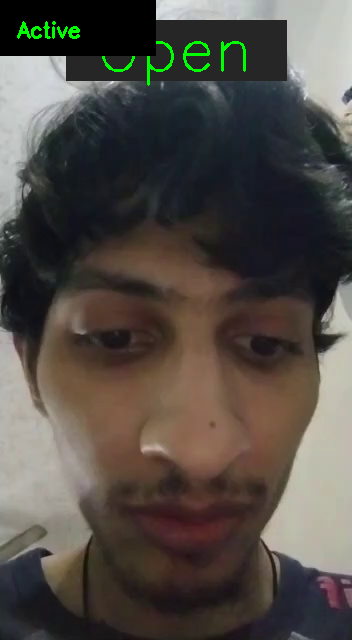

1/1 [==============================] - 0s 17ms/step


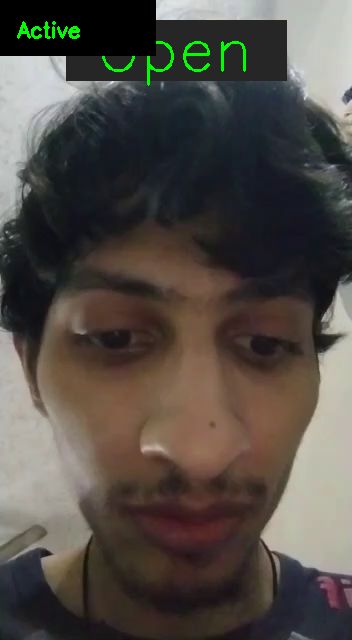

1/1 [==============================] - 0s 24ms/step


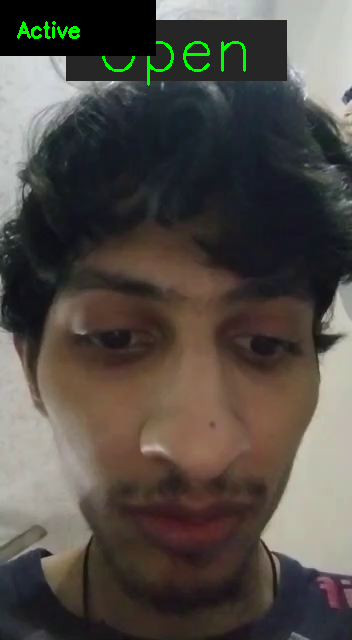

1/1 [==============================] - 0s 17ms/step


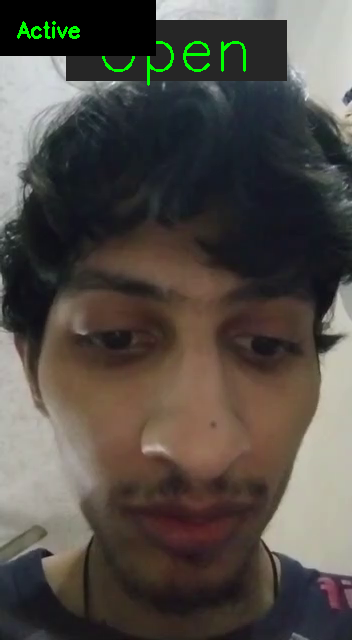

1/1 [==============================] - 0s 16ms/step


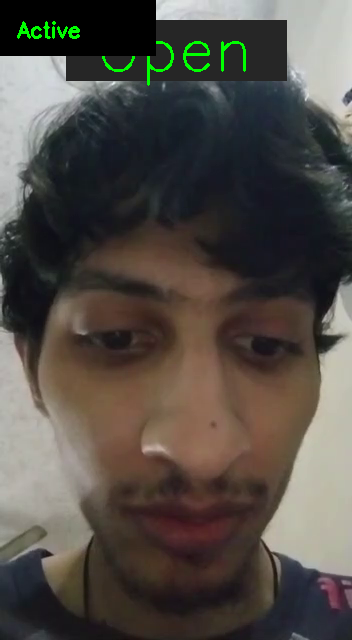

1/1 [==============================] - 0s 16ms/step


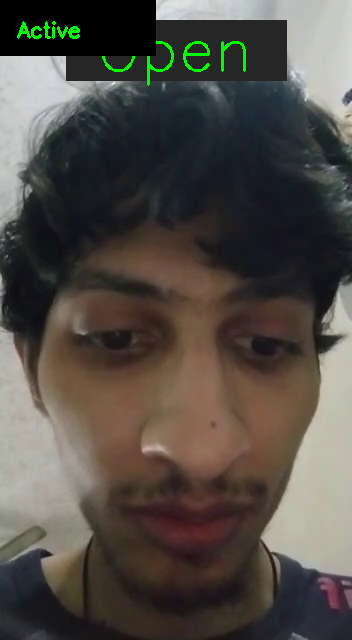

1/1 [==============================] - 0s 19ms/step


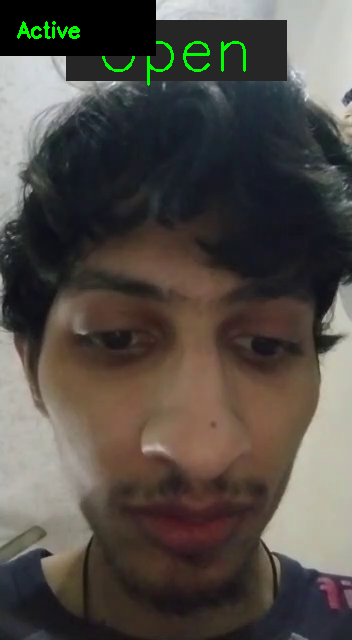

1/1 [==============================] - 0s 16ms/step


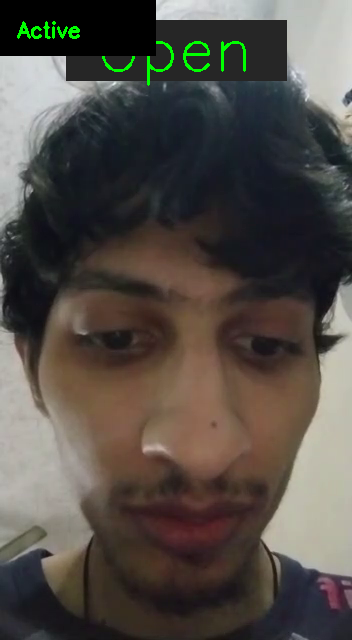

1/1 [==============================] - 0s 15ms/step


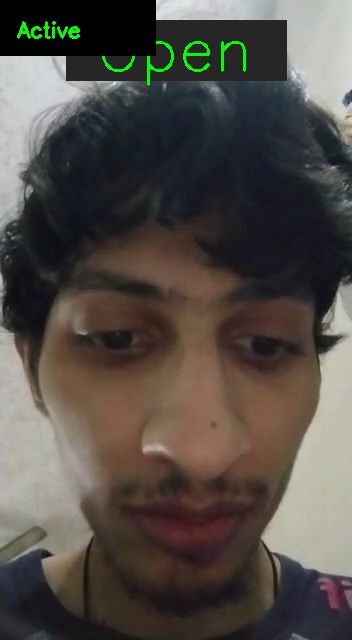

1/1 [==============================] - 0s 17ms/step


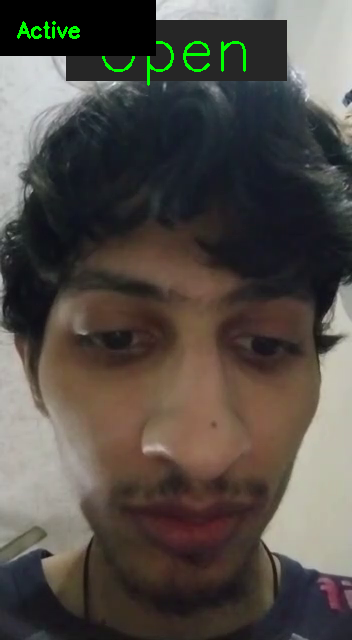

1/1 [==============================] - 0s 16ms/step


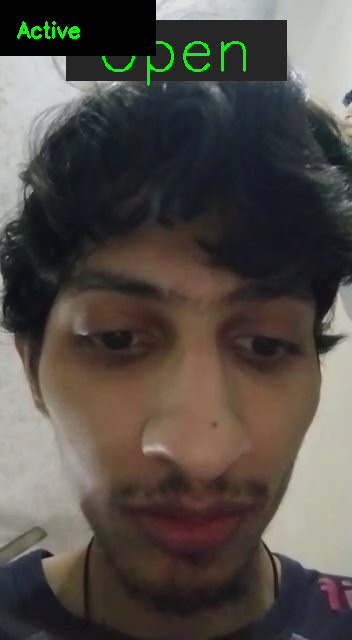

1/1 [==============================] - 0s 17ms/step


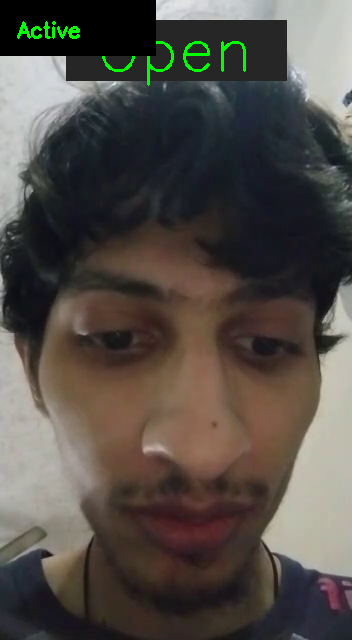

1/1 [==============================] - 0s 16ms/step


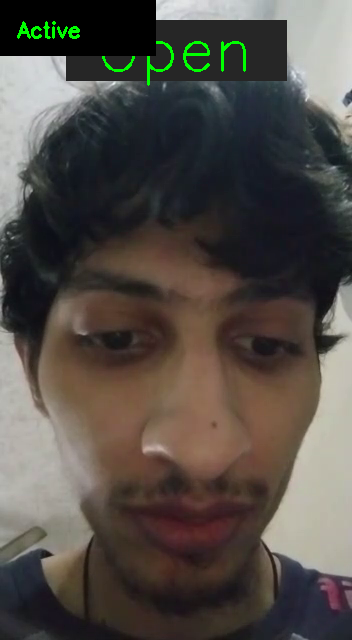

1/1 [==============================] - 0s 18ms/step


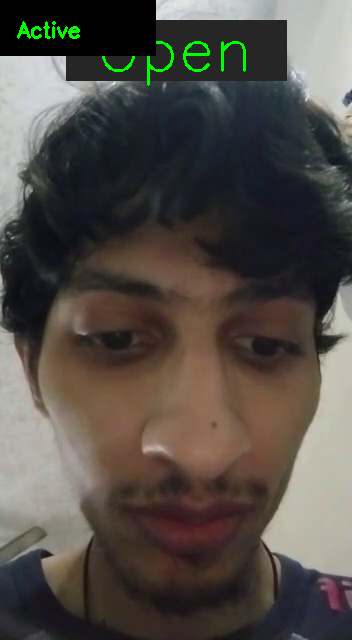

1/1 [==============================] - 0s 16ms/step


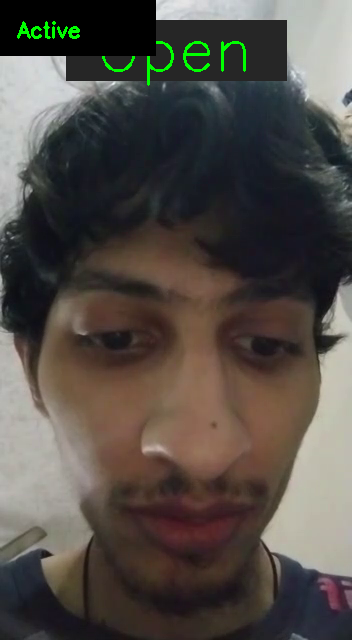

1/1 [==============================] - 0s 27ms/step


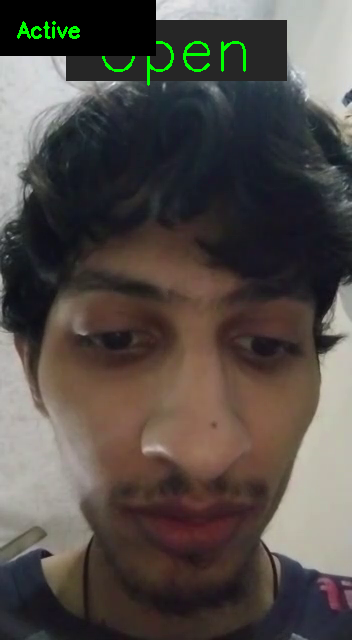

1/1 [==============================] - 0s 18ms/step


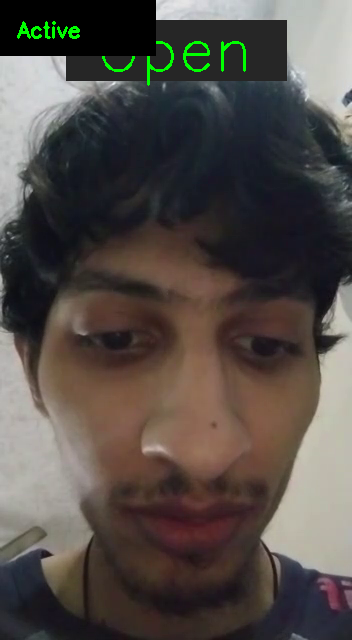

1/1 [==============================] - 0s 16ms/step


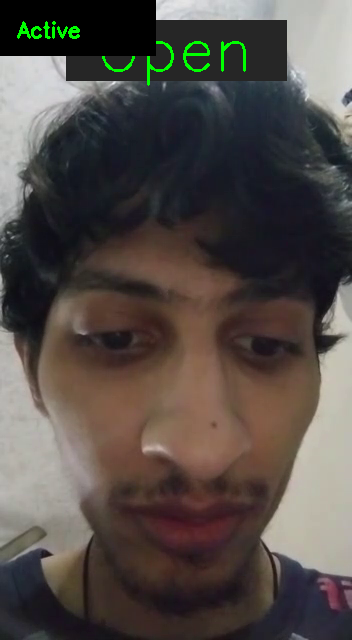

1/1 [==============================] - 0s 19ms/step


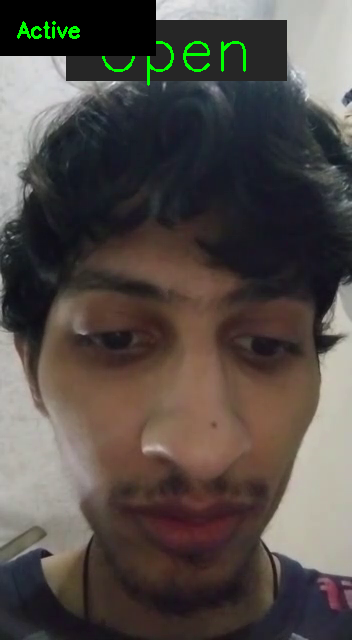

1/1 [==============================] - 0s 17ms/step


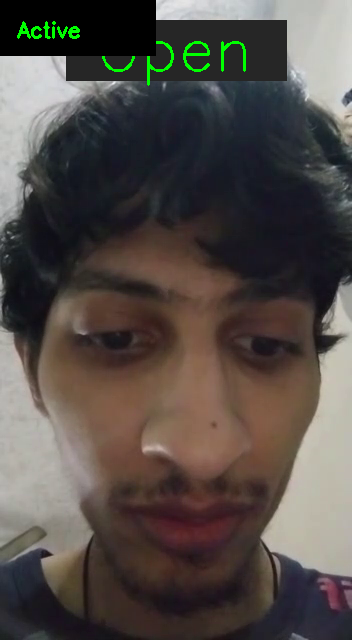

1/1 [==============================] - 0s 16ms/step


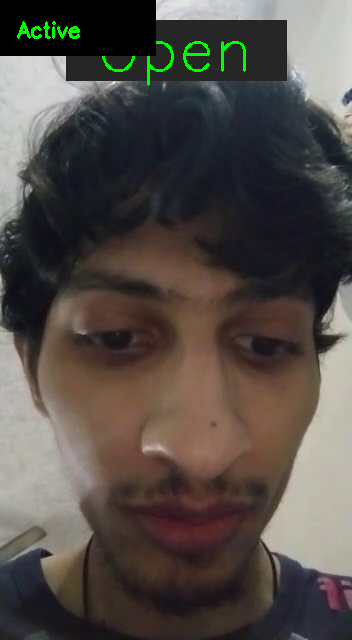

1/1 [==============================] - 0s 16ms/step


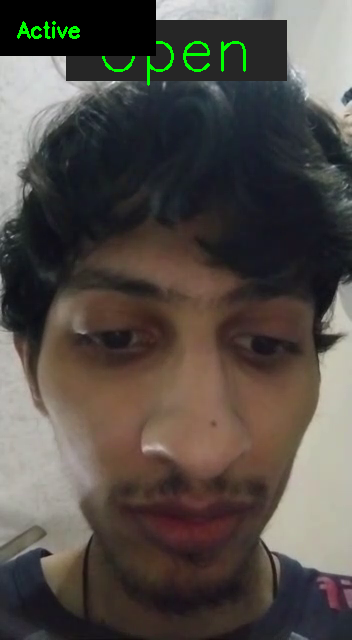

1/1 [==============================] - 0s 15ms/step


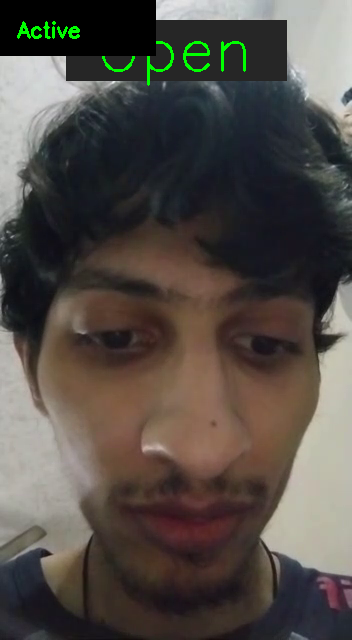

1/1 [==============================] - 0s 17ms/step


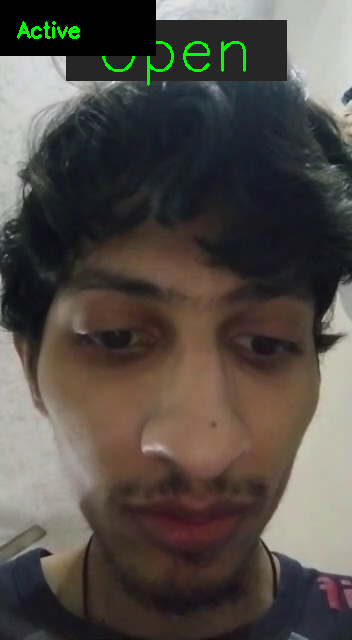

1/1 [==============================] - 0s 16ms/step


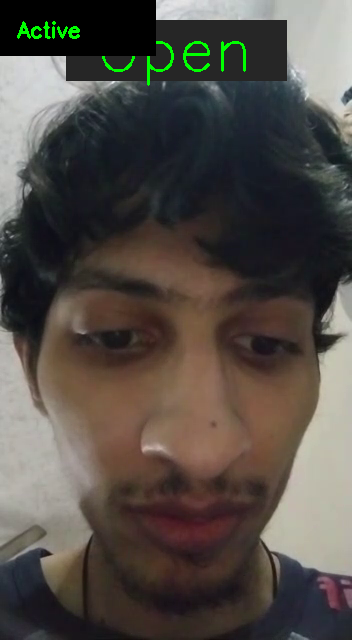

1/1 [==============================] - 0s 20ms/step


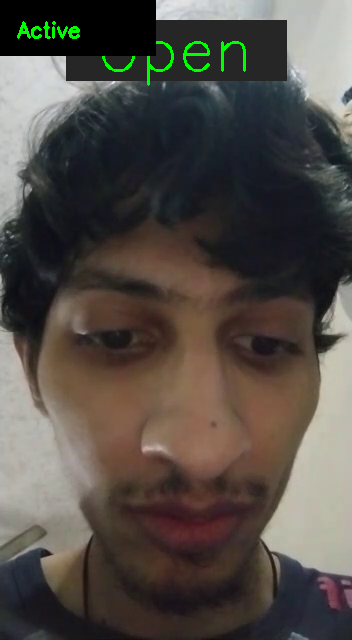

1/1 [==============================] - 0s 18ms/step


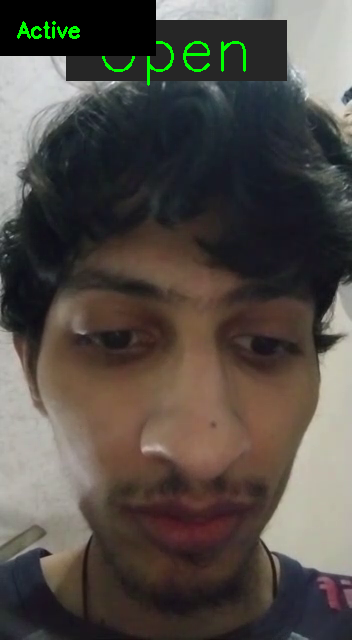

1/1 [==============================] - 0s 16ms/step


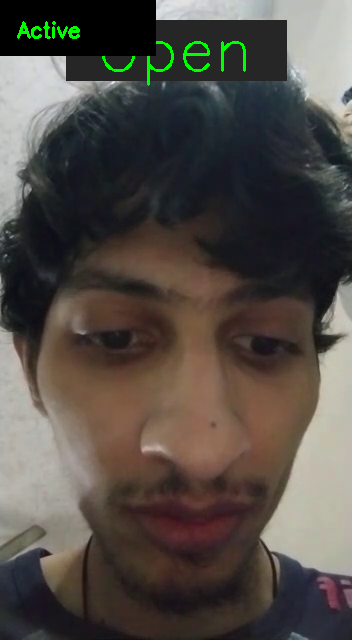

1/1 [==============================] - 0s 16ms/step


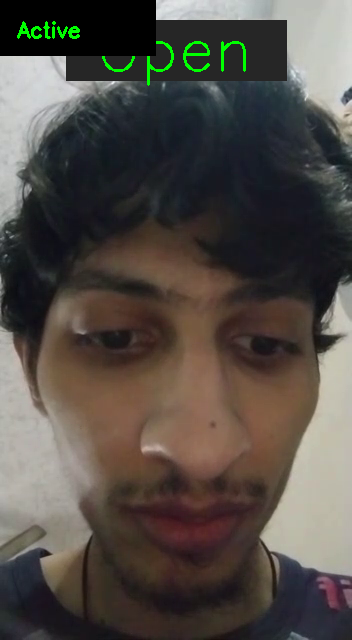

1/1 [==============================] - 0s 17ms/step


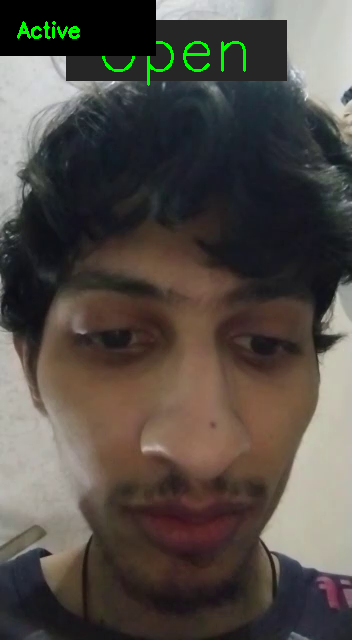

1/1 [==============================] - 0s 16ms/step


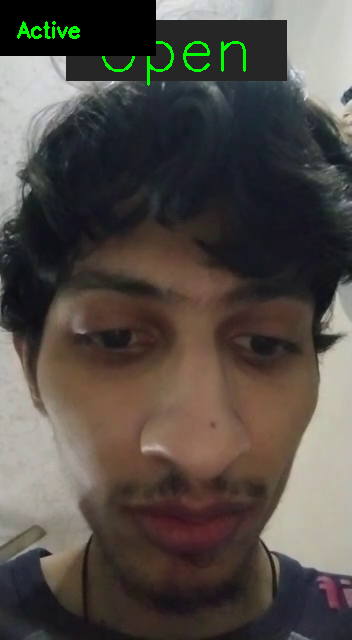

1/1 [==============================] - 0s 24ms/step


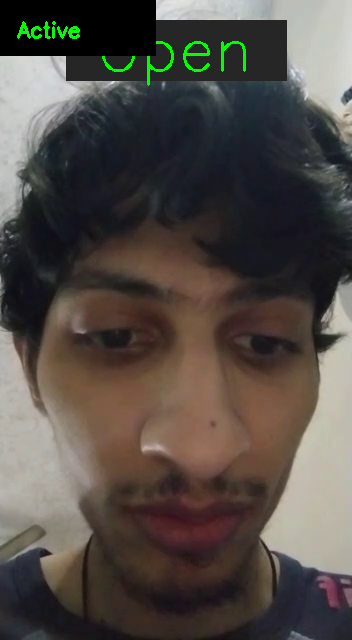

1/1 [==============================] - 0s 17ms/step


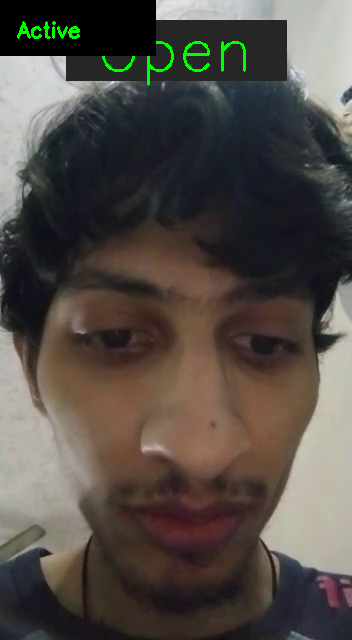

1/1 [==============================] - 0s 19ms/step


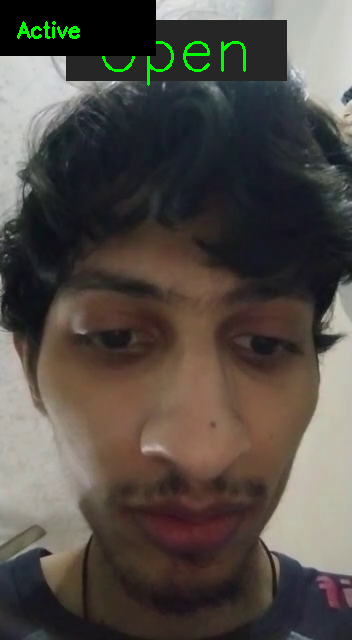

1/1 [==============================] - 0s 16ms/step


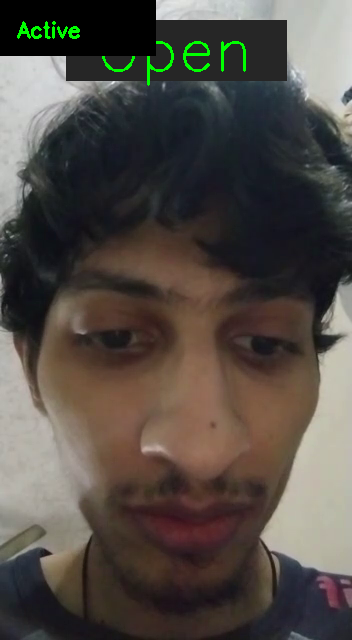

1/1 [==============================] - 0s 20ms/step


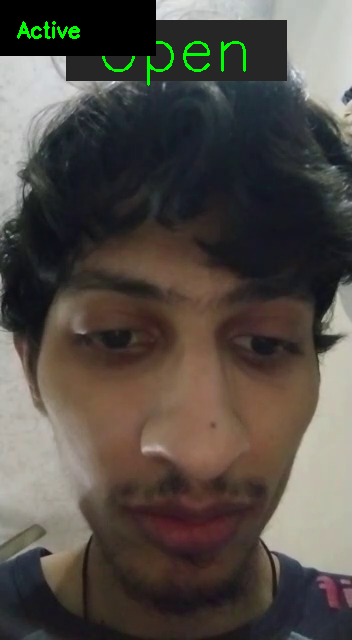

1/1 [==============================] - 0s 17ms/step


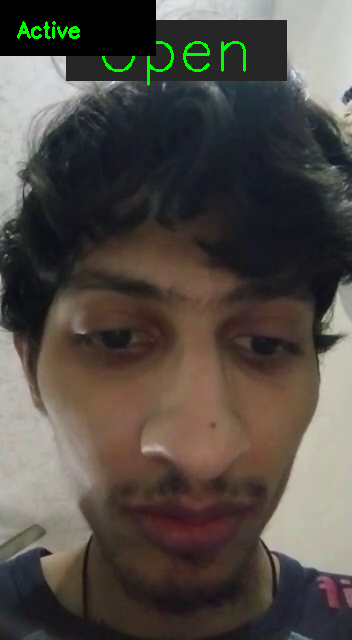

1/1 [==============================] - 0s 17ms/step


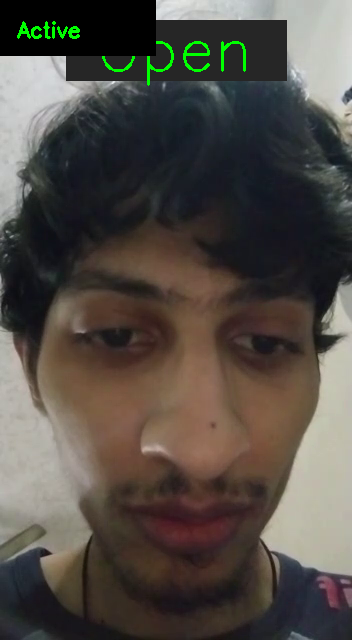

1/1 [==============================] - 0s 20ms/step


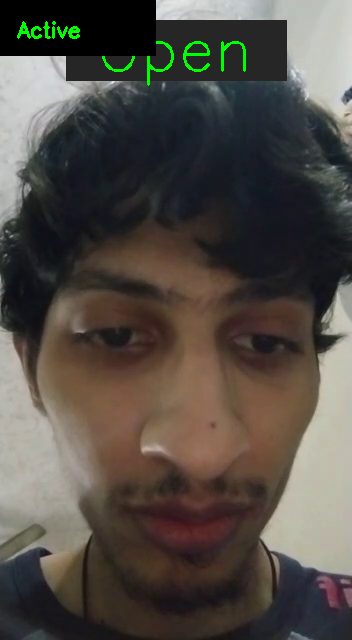

1/1 [==============================] - 0s 21ms/step


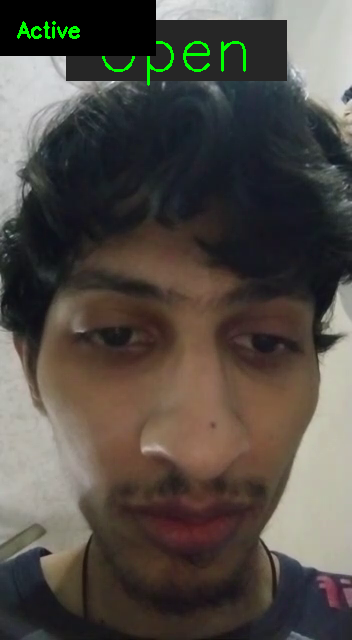

1/1 [==============================] - 0s 17ms/step


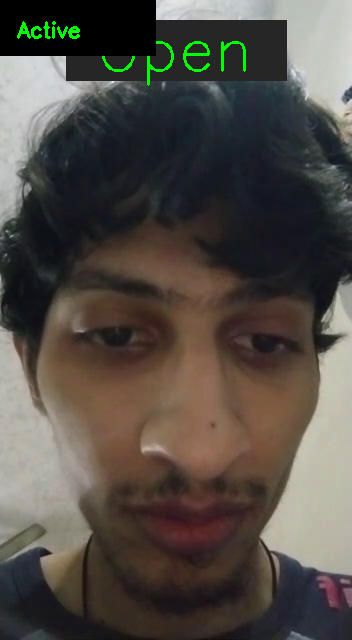

1/1 [==============================] - 0s 16ms/step


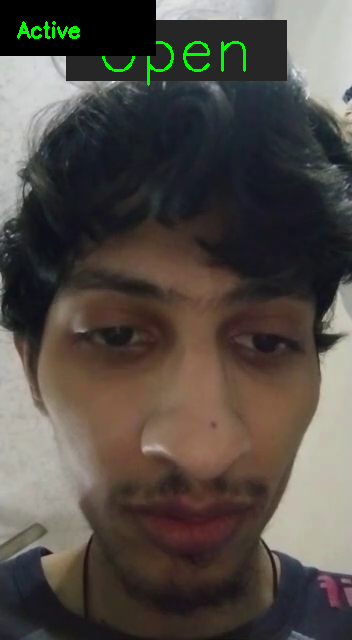

1/1 [==============================] - 0s 15ms/step


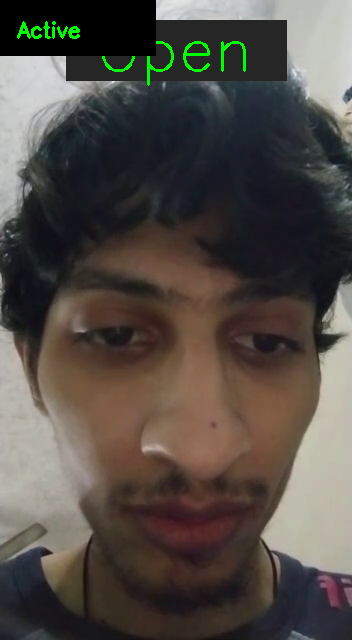

1/1 [==============================] - 0s 16ms/step


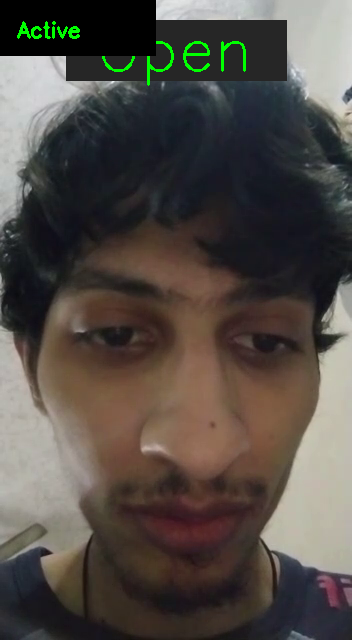

1/1 [==============================] - 0s 17ms/step


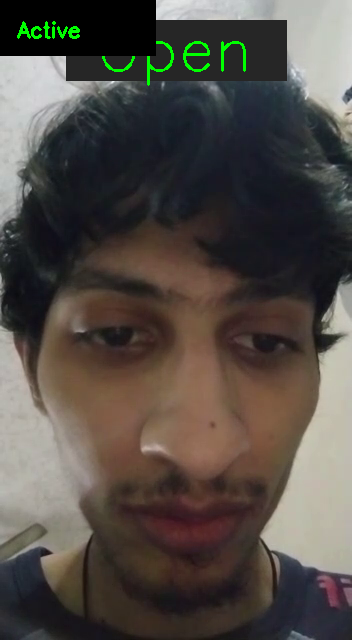

1/1 [==============================] - 0s 16ms/step


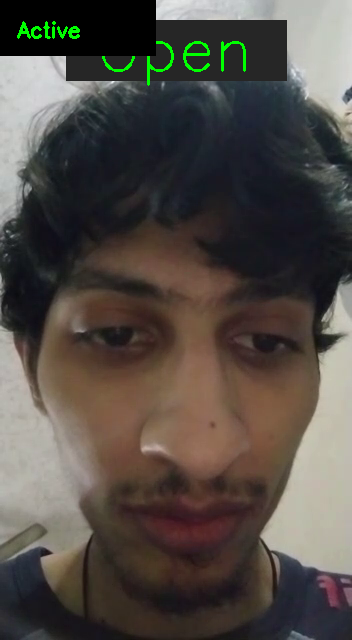

1/1 [==============================] - 0s 16ms/step


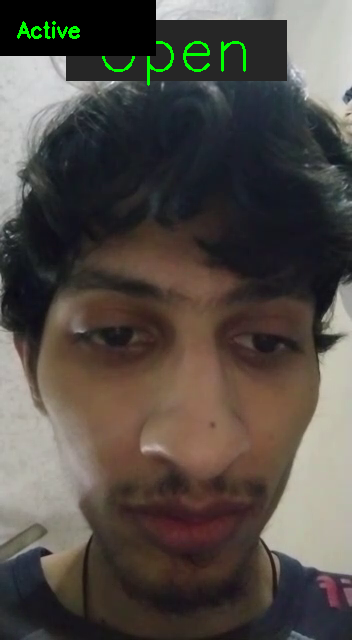

1/1 [==============================] - 0s 22ms/step


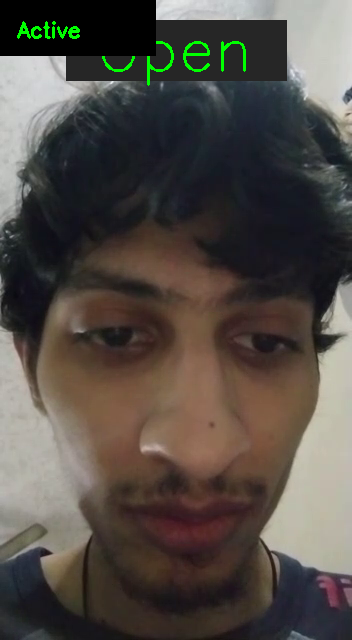

1/1 [==============================] - 0s 17ms/step


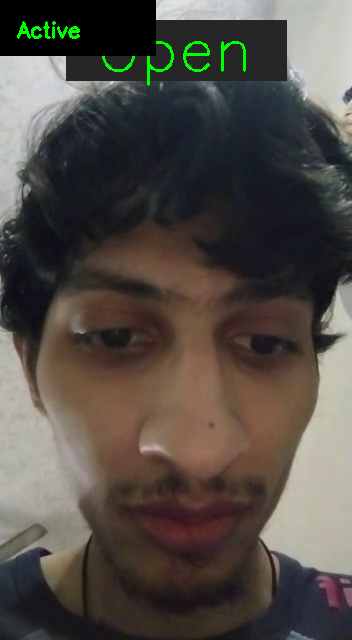

1/1 [==============================] - 0s 18ms/step


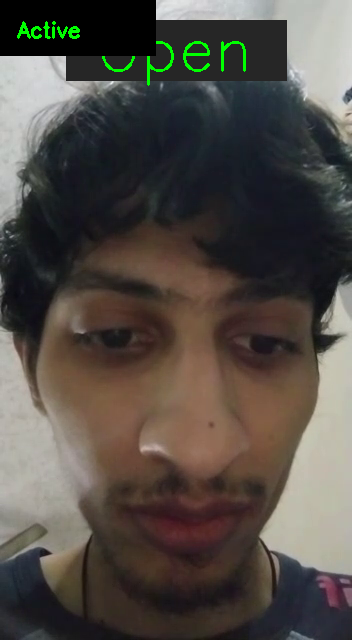

1/1 [==============================] - 0s 25ms/step


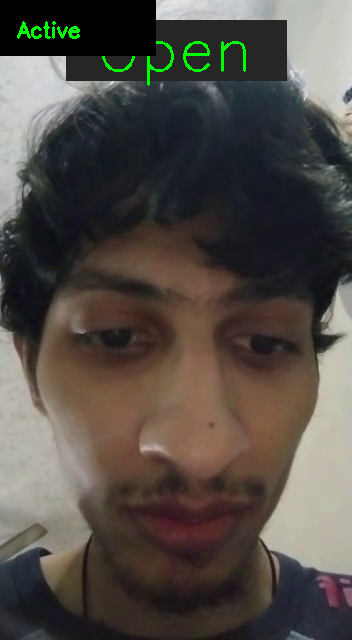

1/1 [==============================] - 0s 23ms/step


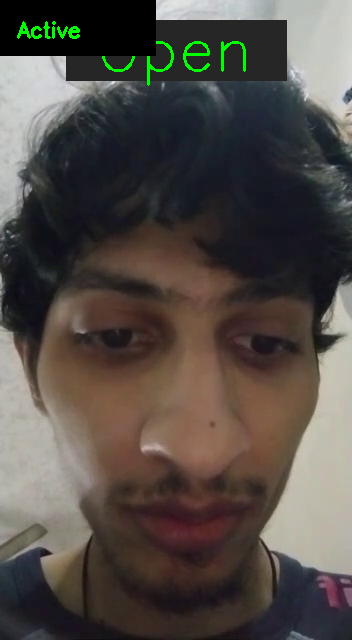

1/1 [==============================] - 0s 23ms/step


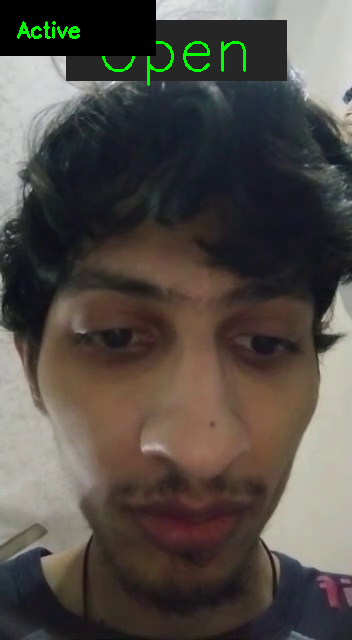

1/1 [==============================] - 0s 23ms/step


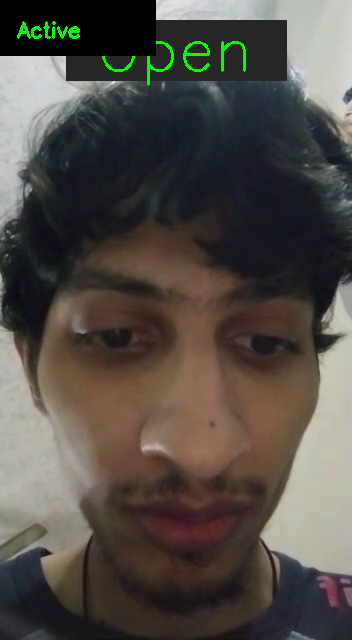

1/1 [==============================] - 0s 24ms/step


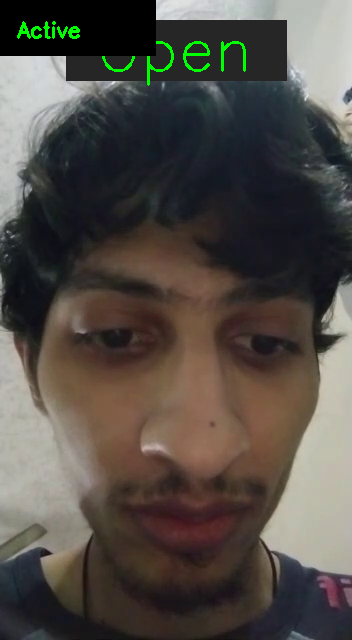

1/1 [==============================] - 0s 28ms/step


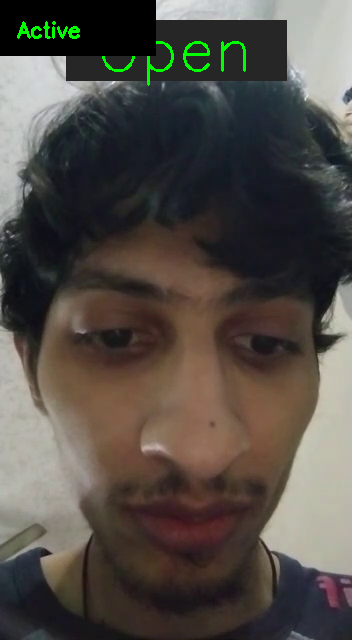

1/1 [==============================] - 0s 23ms/step


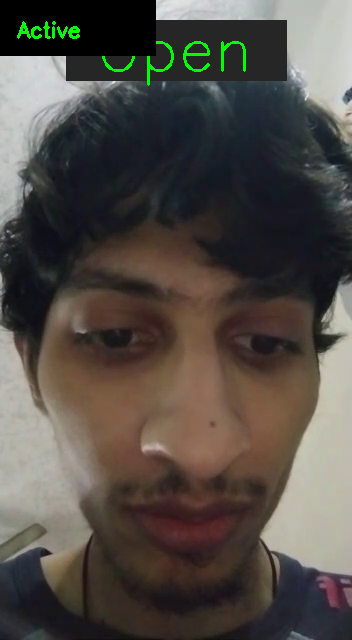

1/1 [==============================] - 0s 37ms/step


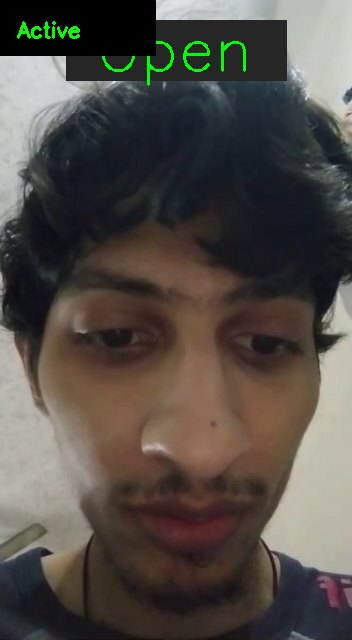

1/1 [==============================] - 0s 27ms/step


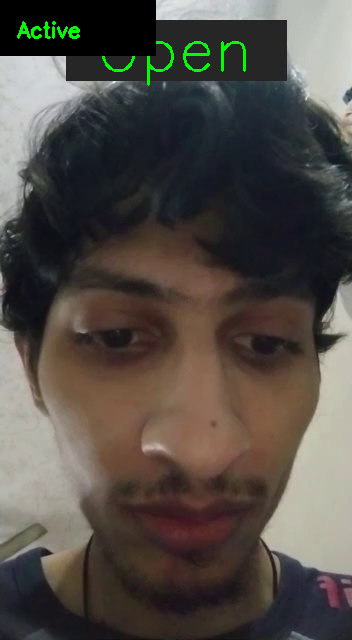

1/1 [==============================] - 0s 22ms/step


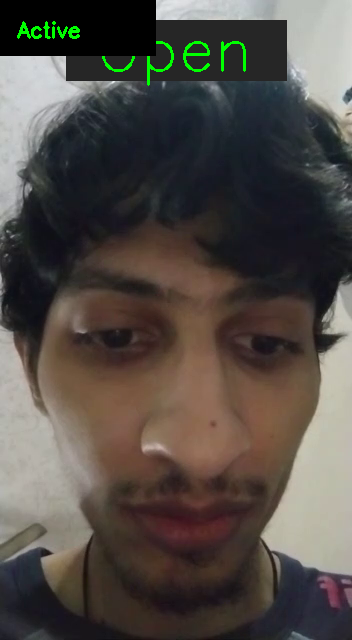

1/1 [==============================] - 0s 24ms/step


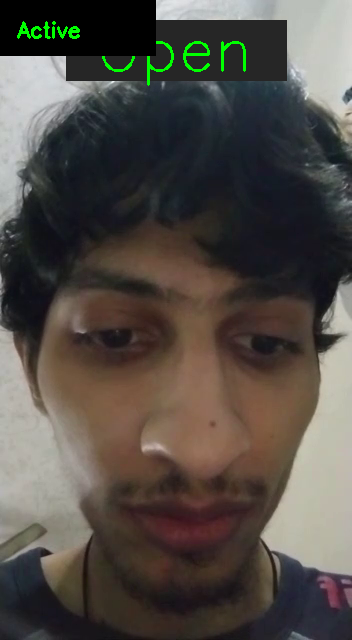

1/1 [==============================] - 0s 22ms/step


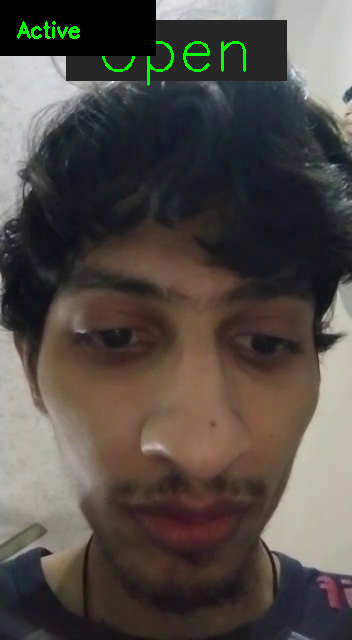

1/1 [==============================] - 0s 25ms/step


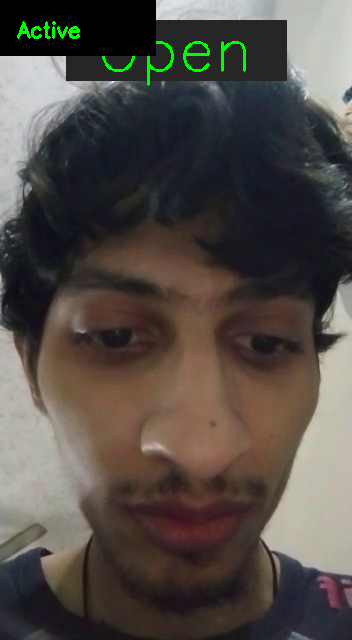

1/1 [==============================] - 0s 24ms/step


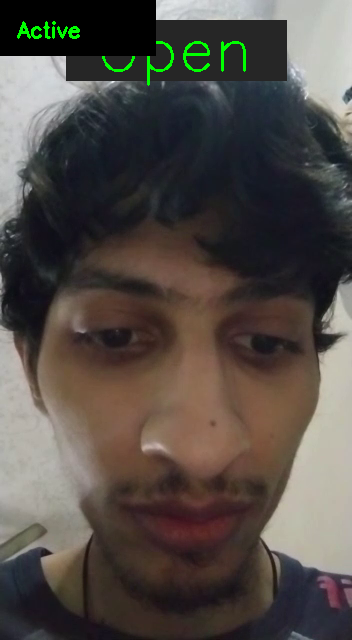

1/1 [==============================] - 0s 23ms/step


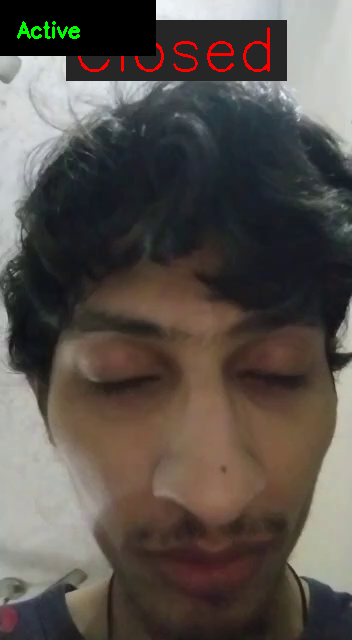

1/1 [==============================] - 0s 22ms/step


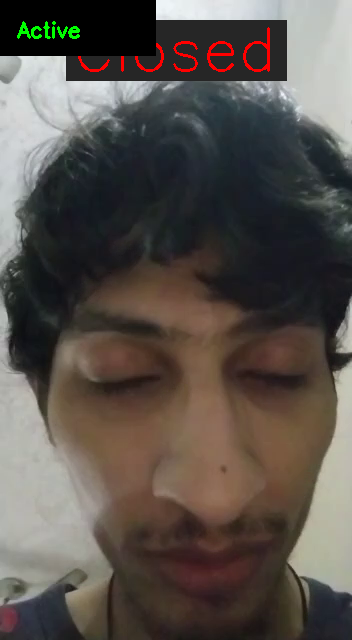

1/1 [==============================] - 0s 25ms/step


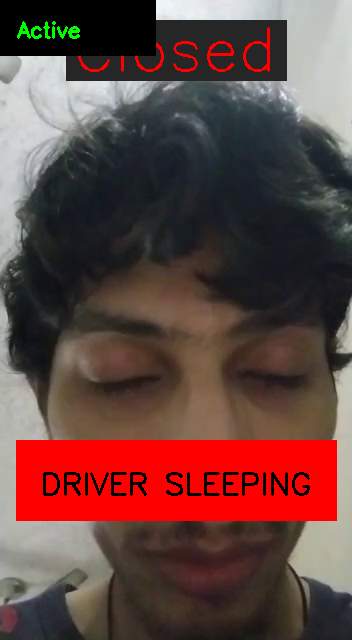

CPU Usage = 24.44
1/1 [==============================] - 0s 25ms/step


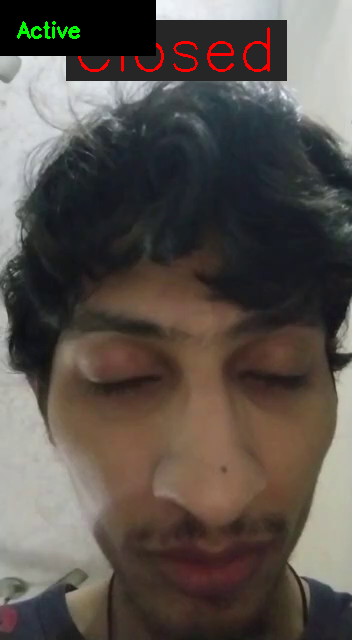

TypeError: ignored

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sat Dec 10 19:12:01 2022

@author: sanau
"""
from datetime import datetime
from packaging import version
import os
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from playsound import playsound
from PIL import Image, ImageDraw
import face_recognition
from tensorflow import keras
#from pygame import mixer

# Create a TensorBoard callback
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")

#eye_model = keras.models.load_model('/content/drive/MyDrive/models/Drowsiness_model.h5')
eye_model = keras.models.load_model('/content/drive/MyDrive/models/Drowsiness_model.h5')

# webcam frame is inputted into function
def eye_cropper(frame):

    # create a variable for the facial feature coordinates
    facial_features_list = face_recognition.face_landmarks(frame)

    # create a placeholder list for the eye coordinates
    # and append coordinates for eyes to list unless eyes
    # weren't found by facial recognition
    try:
        eye = facial_features_list[0]['left_eye']
    except:
        try:
            eye = facial_features_list[0]['right_eye']
        except:
            return
    
    # establish the max x and y coordinates of the eye
    x_max = max([coordinate[0] for coordinate in eye])
    x_min = min([coordinate[0] for coordinate in eye])
    y_max = max([coordinate[1] for coordinate in eye])
    y_min = min([coordinate[1] for coordinate in eye])

    # establish the range of x and y coordinates
    x_range = x_max - x_min
    y_range = y_max - y_min

    # in order to make sure the full eye is captured,
    # calculate the coordinates of a square that has a
    # 50% cushion added to the axis with a larger range and
    # then match the smaller range to the cushioned larger range
    if x_range > y_range:
        right = round(.5*x_range) + x_max
        left = x_min - round(.5*x_range)
        bottom = round((((right-left) - y_range))/2) + y_max
        top = y_min - round((((right-left) - y_range))/2)
    else:
        bottom = round(.5*y_range) + y_max
        top = y_min - round(.5*y_range)
        right = round((((bottom-top) - x_range))/2) + x_max
        left = x_min - round((((bottom-top) - x_range))/2)

    # crop the image according to the coordinates determined above
    cropped = frame[top:(bottom + 1), left:(right + 1)]

    # resize the image
    cropped = cv2.resize(cropped, (128,128))
    image_for_prediction = cropped.reshape(-1, 128, 128, 3)

    return image_for_prediction

# initiate webcam
cap = cv2.VideoCapture('/content/My Video.mp4')
w = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
h = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
if not cap.isOpened():
    raise IOError('Cannot open webcam')

# set a counter
counter = 0

# create a while loop that runs while webcam is in use
while True:

    # capture frames being outputted by webcam
    ret, frame = cap.read()

    # use only every other frame to manage speed and memory usage
    frame_count = 0
    if frame_count == 0:
        frame_count += 1
        pass
    else:
        count = 0
        continue

    # function called on the frame
    image_for_prediction = eye_cropper(frame)
    try:
        image_for_prediction = image_for_prediction/255.0
    except:
        continue

    # get prediction from model
    prediction = eye_model.predict(image_for_prediction)

    # Based on prediction, display either "Open Eyes" or "Closed Eyes"
    if prediction > 0.5:
        counter = 0
        status = 'Open'

        cv2.rectangle(frame, (round(w/2) - 110,20), (round(w/2) + 110, 80), (38,38,38), -1)

        cv2.putText(frame, status, (round(w/2)-80,70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,255,0), 2, cv2.LINE_4)
        x1, y1,w1,h1 = 0,0,175,75
        ## Draw black backgroun rectangle
        cv2.rectangle(frame, (x1,x1), (x1+w1-20, y1+h1-20), (0,0,0), -1)
        ## Add text
        cv2.putText(frame, 'Active', (x1 +int(w1/10), y1+int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255,0),2)
    else:
        counter = counter + 1
        status = 'Closed'

        cv2.rectangle(frame, (round(w/2) - 110,20), (round(w/2) + 110, 80), (38,38,38), -1)

        cv2.putText(frame, status, (round(w/2)-104,70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,255), 2, cv2.LINE_4)
        x1, y1,w1,h1 = 0,0,175,75
        ## Draw black backgroun rectangle
        cv2.rectangle(frame, (x1,x1), (x1+w1-20, y1+h1-20), (0,0,0), -1)
        ## Add text
        cv2.putText(frame, 'Active', (x1 +int(w1/10), y1+int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255,0),2)

        # if the counter is greater than 3, play and show alert that user is asleep
        if counter > 2:

            ## Draw black background rectangle
            cv2.rectangle(frame, (round(w/2) - 160, round(h) - 200), (round(w/2) + 160, round(h) - 120), (0,0,255), -1)
            cv2.putText(frame, 'DRIVER SLEEPING', (round(w/2)-136,round(h) - 146), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 2, cv2.LINE_4)
            cv2_imshow(frame)
            k = cv2.waitKey(1)
            ## Sound
            counter = 1
            import os
    
            CPU_Pct=str(round(float(os.popen('''grep 'cpu ' /proc/stat | awk '{usage=($2+$4)*100/($2+$4+$5)} END {print usage }' ''').readline()),2))
            print("CPU Usage = " + CPU_Pct)  # print results
            continue

    
    cv2_imshow(frame)
    k = cv2.waitKey(1)
    if k == 27:
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
import os
    
CPU_Pct=str(round(float(os.popen('''grep 'cpu ' /proc/stat | awk '{usage=($2+$4)*100/($2+$4+$5)} END {print usage }' ''').readline()),2))
print("CPU Usage = " + CPU_Pct)  # print results


CPU Usage = 12.36


In [ ]:
import psutil
pid = os.getpid()
python_process = psutil.Process(pid)
memoryUse = python_process.memory_info()[0]/2.**30  # memory use in GB...I think
print('memory use:', memoryUse)

memory use: 0.1161956787109375
